In [1]:
# crea graficos interactivos
%matplotlib inline
from astropy.io import fits #para acceder a los archivos FITS
from astropy.table import Table # para crear tablas ordenadas de los datos
import matplotlib.pyplot as plt # para plotear datos
import pandas as pd
import numpy as np
import glob
import math
import os
import random as rnd

# mostrar max columnas necesarias
pd.set_option('display.max_columns', 500) 

In [2]:
from astroquery.mast import Mast
from astroquery.mast import Observations

In [3]:
df_koi = pd.read_csv("./mast-info.csv", skiprows=53)

# sacamos solo confirmados, 1 en particular
df_koi = df_koi[df_koi["koi_disposition"] == "CONFIRMED"]
df_koi
# df_koi["kepler_name"].tolist()

,kepid,kepoi_name,kepler_name,koi_disposition,koi_pdisposition,koi_score,koi_fpflag_nt,koi_fpflag_ss,koi_fpflag_co,koi_fpflag_ec,koi_period,koi_period_err1,koi_period_err2,koi_time0bk,koi_time0bk_err1,koi_time0bk_err2,koi_impact,koi_impact_err1,koi_impact_err2,koi_duration,koi_duration_err1,koi_duration_err2,koi_depth,koi_depth_err1,koi_depth_err2,koi_prad,koi_prad_err1,koi_prad_err2,koi_teq,koi_teq_err1,koi_teq_err2,koi_insol,koi_insol_err1,koi_insol_err2,koi_model_snr,koi_tce_plnt_num,koi_tce_delivname,koi_steff,koi_steff_err1,koi_steff_err2,koi_slogg,koi_slogg_err1,koi_slogg_err2,koi_srad,koi_srad_err1,koi_srad_err2,ra,dec,koi_kepmag
0,10797460,K00752.01,Kepler-227 b,CONFIRMED,CANDIDATE,1.000,0,0,0,0,9.488036,0.000028,-0.000028,170.53875,0.00216,-0.00216,0.146,0.3180,-0.1460,2.9575,0.0819,-0.0819,615.8,19.5,-19.5,2.26,0.26,-0.15,793.0,NaN,NaN,93.59,29.45,-16.65,35.8,1.0,q1_q17_dr25_tce,5455.0,81.0,-81.0,4.467,0.064,-0.096,0.927,0.105,-0.061,291.93423,48.141651,15.347
1,10797460,K00752.02,Kepler-227 c,CONFIRMED,CANDIDATE,0.969,0,0,0,0,54.418383,0.000248,-0.000248,162.51384,0.00352,-0.00352,0.586,0.0590,-0.4430,4.5070,0.1160,-0.1160,874.8,35.5,-35.5,2.83,0.32,-0.19,443.0,NaN,NaN,9.11,2.87,-1.62,25.8,2.0,q1_q17_dr25_tce,5455.0,81.0,-81.0,4.467,0.064,-0.096,0.927,0.105,-0.061,291.93423,48.141651,15.347
4,10854555,K00755.01,Kepler-664 b,CONFIRMED,CANDIDATE,1.000,0,0,0,0,2.525592,0.000004,-0.000004,171.59555,0.00113,-0.00113,0.701,0.2350,-0.4780,1.6545,0.0420,-0.0420,603.3,16.9,-16.9,2.75,0.88,-0.35,1406.0,NaN,NaN,926.16,874.33,-314.24,40.9,1.0,q1_q17_dr25_tce,6031.0,169.0,-211.0,4.438,0.070,-0.210,1.046,0.334,-0.133,288.75488,48.226200,15.509
5,10872983,K00756.01,Kepler-228 d,CONFIRMED,CANDIDATE,1.000,0,0,0,0,11.094321,0.000020,-0.000020,171.20116,0.00141,-0.00141,0.538,0.0300,-0.4280,4.5945,0.0610,-0.0610,1517.5,24.2,-24.2,3.90,1.27,-0.42,835.0,NaN,NaN,114.81,112.85,-36.70,66.5,1.0,q1_q17_dr25_tce,6046.0,189.0,-232.0,4.486,0.054,-0.229,0.972,0.315,-0.105,296.28613,48.224670,15.714
6,10872983,K00756.02,Kepler-228 c,CONFIRMED,CANDIDATE,1.000,0,0,0,0,4.134435,0.000010,-0.000010,172.97937,0.00190,-0.00190,0.762,0.1390,-0.5320,3.1402,0.0673,-0.0673,686.0,18.7,-18.7,2.77,0.90,-0.30,1160.0,NaN,NaN,427.65,420.33,-136.70,40.2,2.0,q1_q17_dr25_tce,6046.0,189.0,-232.0,4.486,0.054,-0.229,0.972,0.315,-0.105,296.28613,48.224670,15.714
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7658,11442793,K00351.07,Kepler-90 f,CONFIRMED,CANDIDATE,0.995,0,0,0,0,124.922516,0.002816,-0.002816,129.72950,0.02160,-0.02160,0.943,0.0280,-0.6450,11.9420,0.4510,-0.4510,498.7,21.6,-21.6,3.37,0.55,-0.45,407.0,NaN,NaN,6.45,2.92,-2.01,24.4,5.0,q1_q17_dr25_tce,5970.0,107.0,-131.0,4.317,0.110,-0.121,1.200,0.195,-0.160,284.43350,49.305161,13.804
8817,7350067,K06863.01,Kepler-1646 b,CONFIRMED,CANDIDATE,1.000,0,0,0,0,4.485592,0.000011,-0.000011,135.43172,0.00207,-0.00207,0.442,0.0230,-0.4420,0.8161,0.0857,-0.0857,2265.0,203.0,-203.0,0.95,0.16,-0.12,365.0,NaN,NaN,4.20,1.91,-1.11,15.0,1.0,q1_q17_dr25_tce,3236.0,41.0,-25.0,5.097,0.055,-0.050,0.193,0.034,-0.025,287.52640,42.912899,15.737
8956,9730163,K02704.03,Kepler-445 d,CONFIRMED,CANDIDATE,NaN,0,0,0,0,8.152759,0.000066,-0.000066,134.19046,0.00792,-0.00792,0.461,0.0838,-0.4086,1.7460,0.2400,-0.2400,16536.0,2312.0,-2312.0,2.44,1.62,-0.70,305.0,NaN,NaN,2.03,4.47,-1.06,9.2,3.0,q1_q17_dr24_tce,3327.0,125.0,-58.0,5.113,0.140,-0.140,0.189,0.125,-0.054,298.73611,46.498634,17.475
9014,8311864,K07016.01,Kepler-452 b,CONFIRMED,CANDIDATE,0.771,0,0,0,0,384.847556,0.007105,-0.007105,314.97000,0.01520,-0.01520,0.059,0.3870,-0.0590,9.9690,0.4410,-0.4410,189.9,17.6,-17.6,1.09,0.20,-0.10,220.0,NaN,NaN,0.56,0.32,-0.15,12.3,1.0,q1_q17_dr25_tce,5579.0,150.0,-150.0,4.580,0.034,-0.127,0.798,0.150,-0.075,296.00369,44.277561,13.426


&#39;Kepler-1399 b&#39;

In [4]:
kepler_name = "Kepler-253 d"
kepler_name = "Kepler-1 b"
# kepler_name = df_koi.sample()['kepler_name'].iloc[0]
# kepler_name = "Kepler-423b" # paper https://www.aanda.org/articles/aa/full_html/2015/04/aa25062-14/aa25062-14.html
row = df_koi[df_koi["kepler_name"] == kepler_name].iloc[0]
period, t0, duration_hours = row['koi_period'], row['koi_time0bk'], row['koi_duration']

row

kepid                       11446443
kepoi_name                 K00001.01
kepler_name               Kepler-1 b
koi_disposition            CONFIRMED
koi_pdisposition           CANDIDATE
koi_score                      0.811
koi_fpflag_nt                      0
koi_fpflag_ss                      0
koi_fpflag_co                      0
koi_fpflag_ec                      0
koi_period                   2.47061
koi_period_err1              2.7e-08
koi_period_err2             -2.7e-08
koi_time0bk                  122.763
koi_time0bk_err1             8.7e-06
koi_time0bk_err2            -8.7e-06
koi_impact                     0.818
koi_impact_err1                0.001
koi_impact_err2               -0.001
koi_duration                 1.74319
koi_duration_err1            0.00107
koi_duration_err2           -0.00107
koi_depth                      14231
koi_depth_err1                   4.2
koi_depth_err2                  -4.2
koi_prad                       13.04
koi_prad_err1                   0.51
k

In [5]:
# Funcion para establecer el nombre de búsqueda en el MAST de un objeto kepler (KOI)
def get_koi_target_name(kepid):
    koi_target_name = "kplr" + format(kepid, '09')
    return koi_target_name


In [7]:
# Formateamos el id para que valga para hacer query
koi_target_name = get_koi_target_name(row["kepid"])
koi_target_name

&#39;kplr011446443&#39;

In [8]:

# Buscamos las observaciones que cadencia corta para el KOI actual
keplerObs = Observations.query_criteria(
    target_name=koi_target_name,    # nombre del KOI formateado
    obs_id="*_sc_*",                # observaciones de cadencia corta
    obs_collection='Kepler'         # colección Kepler
)
keplerObs

dataproduct_type,calib_level,obs_collection,obs_id,target_name,s_ra,s_dec,t_min,t_max,t_exptime,wavelength_region,filters,em_min,em_max,target_classification,obs_title,t_obs_release,instrument_name,proposal_pi,proposal_id,proposal_type,project,sequence_number,provenance_name,s_region,jpegURL,dataURL,dataRights,mtFlag,srcDen,intentType,obsid,objID
str10,int64,str6,str36,str13,float64,float64,float64,float64,float64,str7,str6,float64,float64,str1,str22,float64,str6,str15,str7,str6,str6,int64,str6,str112,str109,str108,str6,bool,float64,str7,str10,str10
timeseries,2,Kepler,kplr011446443_sc_Q113313330333033302,kplr011446443,286.80847100000005,49.3164,54953.02777777778,56423.510416666664,60.0,OPTICAL,KEPLER,418400000000.0,905000000000.0,--,Overlap of EX and STKS,nan,Kepler,William Borucki,EX_STKS,Kepler,Kepler,--,Kepler,POLYGON ICRS 286.80506225 49.31862200 286.80506256 49.31417800 286.81187944 49.31417800 286.81187975 49.31862200,http://archive.stsci.edu/missions/kepler/previews/0114/011446443/kplr011446443-2012310112549_slc_bw_large.png,http://archive.stsci.edu/missions/kepler/lightcurves/0114/011446443/kplr011446443_sc_Q113313330333033302.tar,PUBLIC,--,5885.0,science,9000210988,9000192185


In [9]:
# sacamos todos los productos que hay
keplerProds = Observations.get_product_list(keplerObs[-1])
display(keplerProds)

obsID,obs_collection,dataproduct_type,obs_id,description,type,dataURI,productType,productGroupDescription,productSubGroupDescription,productDocumentationURL,project,prvversion,proposal_id,productFilename,size,parent_obsid
str10,str6,str10,str36,str60,str1,str110,str9,str28,str8,str1,str6,str1,str7,str44,int64,str10
9000210988,Kepler,timeseries,kplr011446443_sc_Q113313330333033302,Preview-Full,C,mast:Kepler/url/missions/kepler/previews/0114/011446443/kplr011446443-2012310112549_slc_bw_large.png,PREVIEW,--,--,--,Kepler,--,EX_STKS,kplr011446443-2012310112549_slc_bw_large.png,22967,9000210988
9000210988,Kepler,timeseries,kplr011446443_sc_Q113313330333033302,tar file for Target Pixel Short Cadence (TPS) - all quarters,C,mast:Kepler/url/missions/kepler/target_pixel_files/0114/011446443/kplr011446443_tpf_sc_Q113313330333033302.tar,SCIENCE,--,--,--,Kepler,--,EX_STKS,kplr011446443_tpf_sc_Q113313330333033302.tar,1276661760,9000210988
9000210988,Kepler,timeseries,kplr011446443_sc_Q113313330333033302,tar file for Lightcurves Short Cadence (CSC) - all quarters,C,mast:Kepler/url/missions/kepler/lightcurves/0114/011446443/kplr011446443_sc_Q113313330333033302.tar,SCIENCE,Minimum Recommended Products,--,--,Kepler,--,EX_STKS,kplr011446443_sc_Q113313330333033302.tar,162201600,9000210988
9000210988,Kepler,timeseries,kplr011446443_sc_Q113313330333033302,Lightcurve Short Cadence (CSC) - Q0,C,mast:Kepler/url/missions/kepler/lightcurves/0114/011446443/kplr011446443-2009131110544_slc.fits,SCIENCE,Minimum Recommended Products,SLC,--,Kepler,--,EX_STKS,kplr011446443-2009131110544_slc.fits,1457280,9000210988
9000210988,Kepler,timeseries,kplr011446443_sc_Q113313330333033302,Lightcurve Short Cadence (CSC) - Q1,C,mast:Kepler/url/missions/kepler/lightcurves/0114/011446443/kplr011446443-2009166044711_slc.fits,SCIENCE,Minimum Recommended Products,SLC,--,Kepler,--,EX_STKS,kplr011446443-2009166044711_slc.fits,4947840,9000210988
9000210988,Kepler,timeseries,kplr011446443_sc_Q113313330333033302,Lightcurve Short Cadence (CSC) - Q2,C,mast:Kepler/url/missions/kepler/lightcurves/0114/011446443/kplr011446443-2009201121230_slc.fits,SCIENCE,Minimum Recommended Products,SLC,--,Kepler,--,EX_STKS,kplr011446443-2009201121230_slc.fits,4550400,9000210988
9000210988,Kepler,timeseries,kplr011446443_sc_Q113313330333033302,Lightcurve Short Cadence (CSC) - Q2,C,mast:Kepler/url/missions/kepler/lightcurves/0114/011446443/kplr011446443-2009231120729_slc.fits,SCIENCE,Minimum Recommended Products,SLC,--,Kepler,--,EX_STKS,kplr011446443-2009231120729_slc.fits,4432320,9000210988
9000210988,Kepler,timeseries,kplr011446443_sc_Q113313330333033302,Lightcurve Short Cadence (CSC) - Q2,C,mast:Kepler/url/missions/kepler/lightcurves/0114/011446443/kplr011446443-2009259162342_slc.fits,SCIENCE,Minimum Recommended Products,SLC,--,Kepler,--,EX_STKS,kplr011446443-2009259162342_slc.fits,4011840,9000210988
9000210988,Kepler,timeseries,kplr011446443_sc_Q113313330333033302,Lightcurve Short Cadence (CSC) - Q3,C,mast:Kepler/url/missions/kepler/lightcurves/0114/011446443/kplr011446443-2009291181958_slc.fits,SCIENCE,Minimum Recommended Products,SLC,--,Kepler,--,EX_STKS,kplr011446443-2009291181958_slc.fits,4484160,9000210988


In [10]:
# filtramos para sacar solo los fits de short cadence
keplerProds = Observations.filter_products(
    keplerProds,            # productos de la observación
    extension='_slc.fits',  # archivos fit de cadencia corta
    mrp_only=False  
)
 
display(keplerProds)
print(len(keplerProds), "productos FITS a descargar de SHORT CADENCE")
folderPath = '.\\mastDownload\\Kepler\\' + keplerProds["obs_id"][-1]

obsID,obs_collection,dataproduct_type,obs_id,description,type,dataURI,productType,productGroupDescription,productSubGroupDescription,productDocumentationURL,project,prvversion,proposal_id,productFilename,size,parent_obsid
str10,str6,str10,str36,str60,str1,str110,str9,str28,str8,str1,str6,str1,str7,str44,int64,str10
9000210988,Kepler,timeseries,kplr011446443_sc_Q113313330333033302,Lightcurve Short Cadence (CSC) - Q0,C,mast:Kepler/url/missions/kepler/lightcurves/0114/011446443/kplr011446443-2009131110544_slc.fits,SCIENCE,Minimum Recommended Products,SLC,--,Kepler,--,EX_STKS,kplr011446443-2009131110544_slc.fits,1457280,9000210988
9000210988,Kepler,timeseries,kplr011446443_sc_Q113313330333033302,Lightcurve Short Cadence (CSC) - Q1,C,mast:Kepler/url/missions/kepler/lightcurves/0114/011446443/kplr011446443-2009166044711_slc.fits,SCIENCE,Minimum Recommended Products,SLC,--,Kepler,--,EX_STKS,kplr011446443-2009166044711_slc.fits,4947840,9000210988
9000210988,Kepler,timeseries,kplr011446443_sc_Q113313330333033302,Lightcurve Short Cadence (CSC) - Q2,C,mast:Kepler/url/missions/kepler/lightcurves/0114/011446443/kplr011446443-2009201121230_slc.fits,SCIENCE,Minimum Recommended Products,SLC,--,Kepler,--,EX_STKS,kplr011446443-2009201121230_slc.fits,4550400,9000210988
9000210988,Kepler,timeseries,kplr011446443_sc_Q113313330333033302,Lightcurve Short Cadence (CSC) - Q2,C,mast:Kepler/url/missions/kepler/lightcurves/0114/011446443/kplr011446443-2009231120729_slc.fits,SCIENCE,Minimum Recommended Products,SLC,--,Kepler,--,EX_STKS,kplr011446443-2009231120729_slc.fits,4432320,9000210988
9000210988,Kepler,timeseries,kplr011446443_sc_Q113313330333033302,Lightcurve Short Cadence (CSC) - Q2,C,mast:Kepler/url/missions/kepler/lightcurves/0114/011446443/kplr011446443-2009259162342_slc.fits,SCIENCE,Minimum Recommended Products,SLC,--,Kepler,--,EX_STKS,kplr011446443-2009259162342_slc.fits,4011840,9000210988
9000210988,Kepler,timeseries,kplr011446443_sc_Q113313330333033302,Lightcurve Short Cadence (CSC) - Q3,C,mast:Kepler/url/missions/kepler/lightcurves/0114/011446443/kplr011446443-2009291181958_slc.fits,SCIENCE,Minimum Recommended Products,SLC,--,Kepler,--,EX_STKS,kplr011446443-2009291181958_slc.fits,4484160,9000210988
9000210988,Kepler,timeseries,kplr011446443_sc_Q113313330333033302,Lightcurve Short Cadence (CSC) - Q3,C,mast:Kepler/url/missions/kepler/lightcurves/0114/011446443/kplr011446443-2009322144938_slc.fits,SCIENCE,Minimum Recommended Products,SLC,--,Kepler,--,EX_STKS,kplr011446443-2009322144938_slc.fits,4440960,9000210988
9000210988,Kepler,timeseries,kplr011446443_sc_Q113313330333033302,Lightcurve Short Cadence (CSC) - Q3,C,mast:Kepler/url/missions/kepler/lightcurves/0114/011446443/kplr011446443-2009350160919_slc.fits,SCIENCE,Minimum Recommended Products,SLC,--,Kepler,--,EX_STKS,kplr011446443-2009350160919_slc.fits,3844800,9000210988
9000210988,Kepler,timeseries,kplr011446443_sc_Q113313330333033302,Lightcurve Short Cadence (CSC) - Q4,C,mast:Kepler/url/missions/kepler/lightcurves/0114/011446443/kplr011446443-2010009094841_slc.fits,SCIENCE,Minimum Recommended Products,SLC,--,Kepler,--,EX_STKS,kplr011446443-2010009094841_slc.fits,3096000,9000210988


38 productos FITS a descargar de SHORT CADENCE


In [12]:
Observations.download_products(
    keplerProds, 
    mrp_only = False, 
    cache = True
)

INFO: Found cached file ./mastDownload\Kepler\kplr011446443_sc_Q113313330333033302\kplr011446443-2009131110544_slc.fits with expected size 1457280. [astroquery.query]
INFO: Found cached file ./mastDownload\Kepler\kplr011446443_sc_Q113313330333033302\kplr011446443-2009166044711_slc.fits with expected size 4947840. [astroquery.query]
INFO: Found cached file ./mastDownload\Kepler\kplr011446443_sc_Q113313330333033302\kplr011446443-2009201121230_slc.fits with expected size 4550400. [astroquery.query]
INFO: Found cached file ./mastDownload\Kepler\kplr011446443_sc_Q113313330333033302\kplr011446443-2009231120729_slc.fits with expected size 4432320. [astroquery.query]
INFO: Found cached file ./mastDownload\Kepler\kplr011446443_sc_Q113313330333033302\kplr011446443-2009259162342_slc.fits with expected size 4011840. [astroquery.query]
INFO: Found cached file ./mastDownload\Kepler\kplr011446443_sc_Q113313330333033302\kplr011446443-2009291181958_slc.fits with expected size 4484160. [astroquery.query

Local Path,Status,Message,URL
str95,str8,object,object
./mastDownload\Kepler\kplr011446443_sc_Q113313330333033302\kplr011446443-2009131110544_slc.fits,COMPLETE,None,None
./mastDownload\Kepler\kplr011446443_sc_Q113313330333033302\kplr011446443-2009166044711_slc.fits,COMPLETE,None,None
./mastDownload\Kepler\kplr011446443_sc_Q113313330333033302\kplr011446443-2009201121230_slc.fits,COMPLETE,None,None
./mastDownload\Kepler\kplr011446443_sc_Q113313330333033302\kplr011446443-2009231120729_slc.fits,COMPLETE,None,None
./mastDownload\Kepler\kplr011446443_sc_Q113313330333033302\kplr011446443-2009259162342_slc.fits,COMPLETE,None,None
./mastDownload\Kepler\kplr011446443_sc_Q113313330333033302\kplr011446443-2009291181958_slc.fits,COMPLETE,None,None
./mastDownload\Kepler\kplr011446443_sc_Q113313330333033302\kplr011446443-2009322144938_slc.fits,COMPLETE,None,None
./mastDownload\Kepler\kplr011446443_sc_Q113313330333033302\kplr011446443-2009350160919_slc.fits,COMPLETE,None,None
./mastDownload\Kepler\kplr011446443_sc_Q113313330333033302\kplr011446443-2010009094841_slc.fits,COMPLETE,None,None


In [11]:
fits_files = glob.glob(folderPath + "\\*")
fits_files

[&#39;.\\mastDownload\\Kepler\\kplr011446443_sc_Q113313330333033302\\kplr011446443-2009131110544_slc.fits&#39;,
 &#39;.\\mastDownload\\Kepler\\kplr011446443_sc_Q113313330333033302\\kplr011446443-2009166044711_slc.fits&#39;,
 &#39;.\\mastDownload\\Kepler\\kplr011446443_sc_Q113313330333033302\\kplr011446443-2009201121230_slc.fits&#39;,
 &#39;.\\mastDownload\\Kepler\\kplr011446443_sc_Q113313330333033302\\kplr011446443-2009231120729_slc.fits&#39;,
 &#39;.\\mastDownload\\Kepler\\kplr011446443_sc_Q113313330333033302\\kplr011446443-2009259162342_slc.fits&#39;,
 &#39;.\\mastDownload\\Kepler\\kplr011446443_sc_Q113313330333033302\\kplr011446443-2009291181958_slc.fits&#39;,
 &#39;.\\mastDownload\\Kepler\\kplr011446443_sc_Q113313330333033302\\kplr011446443-2009322144938_slc.fits&#39;,
 &#39;.\\mastDownload\\Kepler\\kplr011446443_sc_Q113313330333033302\\kplr011446443-2009350160919_slc.fits&#39;,
 &#39;.\\mastDownload\\Kepler\\kplr011446443_sc_Q113313330333033302\\kplr011446443-2010009094841_slc.fit

In [12]:
def get_info_from_fits_file(file):
    try:
        bjdrefi = np.nan
        bjdreff = np.nan
        times = np.nan
        sap_fluxes = np.nan
        pdcsap_fluxes = np.nan

        with fits.open(file, lazy_load_hdus=True) as hdulist: 
            header1 = hdulist[1].header
            binaryext = hdulist[1].data

            # binarytable = Table(binaryext)
            # df_bintable = binarytable.to_pandas()

            # En la cabecera tenemos los datos "BJDREF"
            # es el desplazamiento en el array de tiempo (time)
            bjdrefi = header1['BJDREFI'] 
            bjdreff = header1['BJDREFF']

            # Obtenemos las columnas que nos serán relevantes
            times = binaryext['time'] 
            sap_fluxes = binaryext['SAP_FLUX']
            pdcsap_fluxes = binaryext['PDCSAP_FLUX']
    except:
        print(str(file) + " could not be opened")

    return bjdrefi, bjdreff, times, sap_fluxes, pdcsap_fluxes


In [13]:
csv_files = []

for file in fits_files:
    # fits.info(file)

    # print(koi_target_name, file)
    
    bjdrefi, bjdreff, times, sap_fluxes, pdcsap_fluxes = get_info_from_fits_file(file)

    # Convert the time array to full BJD by adding the offset back in.
    bjds = times + bjdrefi + bjdreff 

    # Almacena todos los datos necesarios en un fichero csv
    data = {
        "bjdrefi" : bjdrefi,
        "bjdreff" : bjdreff,
        "times" : times,
        "bjds" : bjds,
        "sap_fluxes" : sap_fluxes,
        "pdcsap_fluxes" : pdcsap_fluxes
    } 
    df_bintable = pd.DataFrame(data, columns = ["bjdrefi", "bjdreff", "times", "bjds", "sap_fluxes", "pdcsap_fluxes"]) 

    csv_path = file.replace("Kepler", "Bintables").replace(".fits",".csv")
    csv_files.append(csv_path)
    if not os.path.exists(os.path.dirname(csv_path)):
        os.makedirs(os.path.dirname(csv_path))
    df_bintable.to_csv(csv_path)
csv_files

[&#39;.\\mastDownload\\Bintables\\kplr011446443_sc_Q113313330333033302\\kplr011446443-2009131110544_slc.csv&#39;,
 &#39;.\\mastDownload\\Bintables\\kplr011446443_sc_Q113313330333033302\\kplr011446443-2009166044711_slc.csv&#39;,
 &#39;.\\mastDownload\\Bintables\\kplr011446443_sc_Q113313330333033302\\kplr011446443-2009201121230_slc.csv&#39;,
 &#39;.\\mastDownload\\Bintables\\kplr011446443_sc_Q113313330333033302\\kplr011446443-2009231120729_slc.csv&#39;,
 &#39;.\\mastDownload\\Bintables\\kplr011446443_sc_Q113313330333033302\\kplr011446443-2009259162342_slc.csv&#39;,
 &#39;.\\mastDownload\\Bintables\\kplr011446443_sc_Q113313330333033302\\kplr011446443-2009291181958_slc.csv&#39;,
 &#39;.\\mastDownload\\Bintables\\kplr011446443_sc_Q113313330333033302\\kplr011446443-2009322144938_slc.csv&#39;,
 &#39;.\\mastDownload\\Bintables\\kplr011446443_sc_Q113313330333033302\\kplr011446443-2009350160919_slc.csv&#39;,
 &#39;.\\mastDownload\\Bintables\\kplr011446443_sc_Q113313330333033302\\kplr011446443-20

In [18]:
def plot_light_curve(bjds, sap_fluxes, pdcsap_fluxes,savePlot=False, fileFrom=None):
    plt.figure(figsize=(9,4))

    # Muestra el flujo de luz corregido y no corregido
    # plt.plot(bjds, np.log(sap_fluxes), '-k', label='SAP Flux') 
    # plt.plot(bjds, np.log(pdcsap_fluxes), '-b', label='PDCSAP Flux')

    plt.plot(bjds, sap_fluxes, '-k', label='SAP Flux') 
    plt.plot(bjds, pdcsap_fluxes, '-b', label='PDCSAP Flux') 

    plt.title('Kepler Light Curve')
    plt.legend()
    plt.xlabel('Time (days)')
    plt.ylabel('Flux (electrons/second)')

    if savePlot:
        plt.savefig(fileFrom+".jpg")
    
    plt.show()


In [19]:
!pip install lightkurve>=1.4.0

In [20]:
def normalize_df_column(df, col_name):
    x = allfluxes[['pdcsap_fluxes']].values.astype(float)
    min_max_scaler = preprocessing.MinMaxScaler()
    x_scaled = min_max_scaler.fit_transform(x)
    return x_scaled

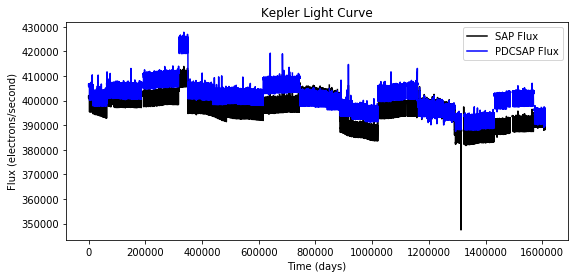

In [25]:
import lightkurve as lk

allfluxes = pd.DataFrame()
for csv in csv_files:
    allfluxes = allfluxes.append(pd.read_csv(csv))

# allfluxes['bjds'] = normalize_df_column(allfluxes, 'bjds')
# allfluxes['sap_fluxes'] = normalize_df_column(allfluxes, 'sap_fluxes')
# allfluxes['pdcsap_fluxes'] = normalize_df_column(allfluxes, 'pdcsap_fluxes')

# allfluxes.dropna()
allfluxes.sort_values(by=['bjds'])
times = [(i+1) for i in range(0,len(allfluxes["bjds"]))]

plot_light_curve(times, allfluxes["sap_fluxes"], allfluxes["pdcsap_fluxes"], False, csv)


lc_raw = lk.LightCurve(
    time=times,
    flux=allfluxes["pdcsap_fluxes"]
).normalize()


In [21]:
lc_clean = lc_raw.remove_outliers(sigma=20, sigma_upper=4)

In [22]:
temp_fold = lc_clean.fold(period, t0=t0)
fractional_duration = (duration_hours / 24.0) / period
phase_mask = np.abs(temp_fold.phase) < (fractional_duration * 1.5)
transit_mask = np.in1d(lc_clean.time, temp_fold.time_original[phase_mask])

In [23]:
lc_flat, trend_lc = lc_clean.flatten(return_trend=True, mask=transit_mask)

In [24]:
lc_fold = lc_flat.fold(period, t0=t0)


In [28]:
lc_global = lc_fold.bin(method='median').normalize() - 1
lc_global = (lc_global / np.abs(lc_global.flux.min()) ) * 2.0 + 1
lc_global.flux.shape


(120816,)

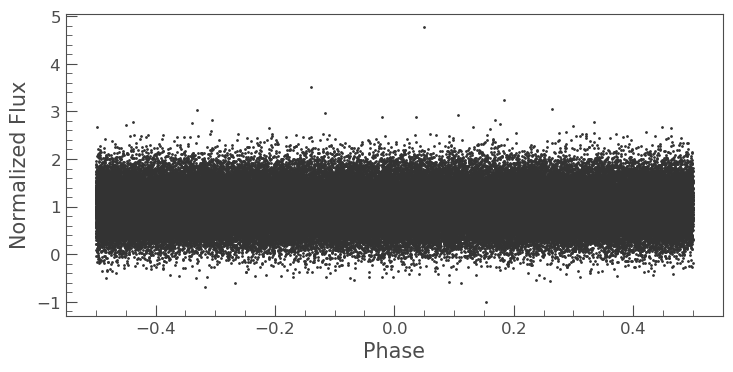

In [29]:
lc_global.scatter();

In [46]:
phase_mask = (lc_fold.phase > -4*fractional_duration) & (lc_fold.phase < 4.0*fractional_duration)
lc_zoom = lc_fold[phase_mask]

In [47]:
lc_local = lc_zoom.bin(method='median').normalize() -1
lc_local = (lc_local / np.abs(lc_local.flux.min()) ) * 2.0 + 1
lc_local.flux.shape

(180,)

In [27]:
lc_local.scatter();

NameError: name &#39;lc_local&#39; is not defined